In [1]:
import datetime
import sys
sys.path.append("..")
import random
from numpy.random import default_rng
from annoy import AnnoyIndex
import torch.autograd as autograd
from typing import List
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
from sklearn.metrics import (adjusted_rand_score, calinski_harabasz_score,
                             normalized_mutual_info_score, silhouette_score)
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import preprocessing


import utils
from sklearn import metrics
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.manifold import TSNE

import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional
import torch.nn.functional as F
from random import sample
from torch.nn.parameter import Parameter
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import scanpy as sc
import time
import os
import torch.nn.utils.weight_norm as weight_norm

from sklearn.metrics import fbeta_score

import colorcet as cc

import seaborn as sns

from matplotlib_venn import venn3, venn2

# from torch.cuda.amp import GradScaler, autocast

torch.cuda.set_device(3)

def setup_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True

plt.ion()
plt.show()
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
path= "../"
# check available files
# !ls ../real_data

# torch.autograd.set_detect_anomaly(True)
import matplotlib
from matplotlib.pyplot import rc_context
matplotlib.rcParams['patch.edgecolor'] = 'black'

from captum.attr import Saliency, NoiseTunnel, LRP, GuidedBackprop, DeepLiftShap, DeepLift, IntegratedGradients

########## NEURAL NETWORK UTILITY ##########
cuda = True if torch.cuda.is_available() else False
FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

CPUTensor =  torch.FloatTensor

from sklearn.preprocessing import StandardScaler

In [2]:
from matplotlib_venn import venn3

In [3]:
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))

matplotlib: 3.7.1


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
sc.settings.verbosity = 1             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300)

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10


In [6]:
model = "genex"

adata_int = sc.read_h5ad('%s_COVID.h5ad' % (model))

# adata_int.var.index = adata_int.var["gene_name"]

adata_int

AnnData object with n_obs × n_vars = 555976 × 5000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cluster', 'ct', 'sample', 'projectID', 'DataID', 'PatientID', 'Disease_Group', 'Severity', 'Stage', 'Age', 'Sex', 'Race', 'Hospital_Day', 'Days_Symotom_Onset', 'Outcome', 'Tissue', 'Frozen', 'Platform', 'WHO.stage', 'City', 'Country', 'Batch', 'CellType', 'batch', 'batch_num', 'Severity_num', 'n_counts'
    var: 'gene'
    uns: 'CellType_colors', 'Severity_num_colors', 'batch_num_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_latent', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'X_raw', 'counts', 'log_norm'
    obsp: 'connectivities', 'distances'

In [7]:
adata_int = adata_int[np.random.choice(555976, 60000, replace=False)]

In [8]:
# adata_int.var.set_index("gene_name", inplace = True)

In [9]:
sc.settings.verbosity = 1
sc.settings.set_figure_params(
    dpi=300, frameon=False, figsize=(3, 3), facecolor='white')

In [10]:
# assume that "sample_id" is a categorical annotation in `adata.obs`
# temp_df = {"0": "10X 3'", "1": "10X 5'"}

# adata_int.obs["batch"] = adata_int.obs["batch"].cat.rename_categories(temp_df)

In [11]:
adata_int.obs["batch"]

TTCGAAGCAAACCTAC-MH8919327--MH8919327        70
TAGAGCTAGAAGAAGC-MH9143424--MH9143424       101
GCTCCTAGTCCAAGTT-MH9179824--MH9179824       108
AGGGTGAGTTCAGGCC-MH9143321--MH9143321        86
BGCV09_AGGGTGAAGGGAAACA-1--BGCV09_CV0062     39
                                           ... 
CCTTCGAGTCCTCTTG-MH9143277--MH9143277        84
BGCV07_CGGAGCTTCACCTTAT-1--BGCV07_CV0137     35
CACCAGGGTACCATCA-MH9143273--MH9143273        80
TCACAAGTCTAACCGA-MH8919179--MH8919179        64
BGCV12_TGGTTCCAGTCTCGGC-1--BGCV12_CV0068     51
Name: batch, Length: 60000, dtype: category
Categories (121, object): ['0', '1', '2', '3', ..., '117', '118', '119', '120']

In [12]:
# fig, ax = plt.subplots(figsize=(8, 6))

# legend_loc='lower center'
# legend_ncol=1
# color = "CellType"
    
# sc.pl.umap(
#     adata_int,
#     color=color,
#     ax=ax,
#     show=False,
#     legend_loc=False,
#     legend_fontsize=12,
# )

# # Get unique labels and colors
# labels = adata_int.obs[color].cat.categories
# vals = set(adata_int.obs[color])
# custom_palette = cc.glasbey_category10 * len(vals)
# colors = custom_palette

# # Create custom legend without title
# handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, markeredgecolor='black', markeredgewidth=1,
#                       markerfacecolor=color, markersize=8) for label, color in zip(labels, colors)]
# legend = ax.legend(handles=handles, title = "Cell Type", loc=legend_loc, bbox_to_anchor=(0.5, -0.6), ncol=legend_ncol)

# # Adjust the figure's layout
# # plt.tight_layout(rect=[0, 0.1, 1, 1])

# plt.show()

In [13]:
# adding the scale value for heatmap and dotplot visualisation

adata_int.layers["X_raw_scaled"] = sc.pp.scale(adata_int.layers["X_raw"].copy(), copy = True)
adata_int.layers["X_corrected_scaled"] = sc.pp.scale(adata_int.obsm["X_latent"].copy(), copy = True)

In [14]:
# # subset to only two cell types that has subtle different which are acinar and ductal cell type
# subset_celltype = ["acinar", "ductal"]

# adata_int = adata_int[adata_int.obs["celltype"].isin(subset_celltype)].copy()

In [15]:
# # remove minority class as we have seen that 5 cell type are very rare
# counts = adata_int.obs["CellType"].value_counts()
# minority_classes = counts.index[-3:].tolist()        # get the minority classes
# adata_int = adata_int[                               # actually subset
#     ~adata_int.obs["CellType"].isin(minority_classes)]
# adata_int.obs["CellType"].cat.reorder_categories(       # reorder according to abundance
#     counts.index[:-3].tolist(), inplace=True)

In [16]:
adata_int.layers["X_corrected"] = adata_int.obsm["X_latent"].copy()

In [17]:
# adata_int.obsm["X_latent"].copy()

In [18]:
# temp_array = adata_int.layers["X_corrected"]
# temp_array[temp_array <= 0.5] = 0.

# adata_int.layers["X_corrected"] = temp_array

# temp_array

In [19]:
# # split per batch into new objects.
# batches = list(set(adata_int.obs['batch']))
# alldata = {}
# for batch in batches:
#     alldata[batch] = adata_int[adata_int.obs['batch'] == batch,]

# alldata    

In [20]:
# # get only the common cell type across all batches
# common_celltype_list = []

# for each in alldata:
#     celltype_list = list(set(alldata[each].obs["CellType"]))
#     common_celltype_list.append(celltype_list)
    
# common_celltype = list(set.intersection(*map(set,common_celltype_list)))

In [21]:
# common_celltype.sort()

In [22]:
# adata_int = adata_int[adata_int.obs["CellType"].isin(common_celltype)].copy()

In [23]:
# adata_int

In [24]:
# adata_int.layers["X_raw"].toarray()

In [25]:
adata_int.layers["X_raw"]

<60000x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 11690966 stored elements in Compressed Sparse Row format>

In [26]:
adata_int.layers["X_corrected"]

array([[0.        , 0.        , 4.3624706 , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 2.9737723 , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 3.2113636 , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.05653012, 0.17458168, 3.9243326 , ..., 0.        , 0.        ,
        0.        ],
       [1.6695384 , 0.        , 4.4102235 , ..., 0.        , 0.        ,
        0.        ],
       [3.3446932 , 0.        , 4.0302086 , ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [27]:
class PadToSameSize(nn.Module):
    def __init__(self, padding_value=0):
        super().__init__()
        self.padding_value = padding_value

    def forward(self, a, b):
        batch_size_a, input_size = a.shape
        batch_size_b, _ = b.shape
        if batch_size_a == batch_size_b:
            return a, b
        elif batch_size_a < batch_size_b:
            pad_size = batch_size_b - batch_size_a
            # check for NaN or infinite values and replace them with a specific value
            a[torch.isnan(a)] = self.padding_value
            a[torch.isinf(a)] = self.padding_value
            padding = torch.full((pad_size, input_size), self.padding_value, dtype=a.dtype, device=a.device)
            a = torch.cat([a, padding], dim=0)
            return a, b
        else:
            pad_size = batch_size_a - batch_size_b
            # check for NaN or infinite values and replace them with a specific value
            b[torch.isnan(b)] = self.padding_value
            b[torch.isinf(b)] = self.padding_value
            padding = torch.full((pad_size, input_size), self.padding_value, dtype=b.dtype, device=b.device)
            b = torch.cat([b, padding], dim=0)
            return a, b
        
class RBF(nn.Module):

    def __init__(self, n_kernels=5, mul_factor=2.0, bandwidth=None):
        super().__init__()
        self.bandwidth_multipliers = mul_factor ** (torch.arange(n_kernels, device = "cuda") - n_kernels // 2)
        self.bandwidth = bandwidth

    def get_bandwidth(self, L2_distances):
        if self.bandwidth is None:
            n_samples = L2_distances.shape[0]
            return L2_distances.data.sum() / (n_samples ** 2 - n_samples)

        return self.bandwidth

    def forward(self, X):
        L2_distances = torch.cdist(X, X) ** 2
        return torch.exp(-L2_distances[None, ...] / (self.get_bandwidth(L2_distances) * self.bandwidth_multipliers)[:, None, None]).sum(dim=0)

class MMDLoss(nn.Module):

    def __init__(self, kernel=RBF()):
        super().__init__()
        self.kernel = kernel

    def forward(self, X, Y):
        K = self.kernel(torch.vstack([X, Y]))

        X_size = X.shape[0]
        XX = K[:X_size, :X_size].mean()
        XY = K[:X_size, X_size:].mean()
        YY = K[X_size:, X_size:].mean()
        return XX - 2 * XY + YY


class KLLossBatches(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, data, batch_labels):
        batch_ids = torch.unique(batch_labels)
        kl_div_loss = 0
#         emd_loss = EMDLoss(self.n_dim, 100)
        mmd_loss = MMDLoss()
#         emd_loss.cuda()
        
        eps = 0
        
        # Compute Hellinger loss considering batch-specific distributions
        hellinger_loss = 0
        n_comparisons = 0
        
        for idx in range(1, len(batch_ids)):
            
            # taking one batch as the anchor
            batch_1 = data[batch_labels == batch_ids[0]]
            batch_2 = data[batch_labels == batch_ids[idx]]
            
            # pad or resize the subsets as necessary
            pad = PadToSameSize()
#             batch_1, batch_2 = pad(batch_1, batch_2)
#             batch_1 = batch_1 + eps
#             batch_2 = batch_2 + eps
            
            # Compute Hellinger distance between batch_data_1 and batch_data_2
            hellinger_dist = mmd_loss(batch_2, batch_1)
            
#             # Add Hellinger distance to the overall loss
            hellinger_loss += hellinger_dist
            n_comparisons += 1
        
        return hellinger_loss

    
class GeneExpressionAttention(nn.Module):
    def __init__(self, n_features, d_k, bias = True):
        super(GeneExpressionAttention, self).__init__()
        self.d_k = d_k
        self.bias = bias
        
        # query representation
        self.W_Q = nn.Linear(n_features, d_k, self.bias)
        
        # key and value pair to attend to
        self.W_K = nn.Linear(n_features, d_k, self.bias)
        self.W_V = nn.Linear(n_features, d_k, self.bias)
        
        # multihead attention
#         self.multi_atten = nn.MultiheadAttention(d_k, 4, kdim = n_features, vdim = n_features, batch_first = True)

#         self.encoder = nn.GRU(n_features, d_k, num_layers = 1, bidirectional = False, batch_first = True)

    def forward(self, tabular_data):
        # Project tabular data into Q, K, and V matrices
        Q = self.W_Q(tabular_data)
        K = self.W_K(tabular_data)
        V = self.W_V(tabular_data)
        
        Q, K, V = Q.unsqueeze(1), K.unsqueeze(1), V.unsqueeze(1)
        
#         attn_output, attn_output_weights = self.multi_atten(Q, K, V)
        
#         return attn_output.squeeze(1)

        return F.scaled_dot_product_attention(Q,K,V, is_causal = True).squeeze(1)

In [28]:
from utils.sophia import SophiaG
from utils.acprop import ACProp
# from pytorch_optimizer import *
from adabelief_pytorch import AdaBelief
from pytorch_optimizer import clip_grad_norm

In [29]:
label_str = "batch"
group_str = "Severity_num"

data_size = 5000
lr = 0.0001
b1 = 0.5
b2 = 0.999
latent_dim = 32
style_dim = latent_dim
embedding_dim = 32
n_dim = 1024
#     proj_dim = 2000
n_critic = 5
global c_dim, ctype_dim
c_dim = len(list(set(adata_int.obs[label_str])))
g_dim = len(list(set(adata_int.obs[group_str])))

act_func = nn.ReLU()

class Discriminator(nn.Module):
    def __init__(self, dropout_rate = 0.1):
        super(Discriminator, self).__init__()

#             self.self_att = nn.Sequential(
#                     GeneExpressionAttention(data_size, embedding_dim),
#                     LinearAttention(embedding_dim, embedding_dim),
#             )

        self.dropout_rate = dropout_rate

        self.model = nn.Sequential(
            GeneExpressionAttention(data_size, n_dim), # adding projection layer
            nn.BatchNorm1d(n_dim),
            nn.Dropout(self.dropout_rate),
            nn.LeakyReLU(0.2),
            nn.Linear(n_dim, n_dim // 2),
            nn.BatchNorm1d(n_dim // 2),
            nn.Dropout(self.dropout_rate),
            nn.LeakyReLU(0.2),
            nn.Linear(n_dim // 2, latent_dim),
            nn.BatchNorm1d(latent_dim),
            nn.LeakyReLU(0.2),
        )

        # Output layers
        self.adv_layer = nn.ModuleList([
            nn.Sequential(
                nn.Linear(latent_dim, 1)
            ) for _ in range(c_dim + g_dim)
        ])

        # Classify layers
        self.cls_layer_c = nn.Sequential(
            nn.Linear(latent_dim, c_dim),
        )

        # classifying groups
        self.cls_layer_g = nn.Sequential(
            nn.Linear(latent_dim, g_dim),
        )

    def forward(self, data):
      #  data = torch.cat((data, label), -1)
#             atten = self.self_att(data)
        out = self.model(data)
#             out = self.residual(out)
        # shortcut connection with attention embeddings
#             out = combine(out, atten)
        validity = [adv(out) for adv in self.adv_layer]
        classify_c = self.cls_layer_c(out)
        classify_g = self.cls_layer_g(out)
        return classify_g
    
D_B = Discriminator()

In [30]:
D_B.load_state_dict(torch.load('Discriminator_rom_COVID.pth'))

<All keys matched successfully>

In [31]:
D_B.cpu()

Discriminator(
  (model): Sequential(
    (0): GeneExpressionAttention(
      (W_Q): Linear(in_features=5000, out_features=1024, bias=True)
      (W_K): Linear(in_features=5000, out_features=1024, bias=True)
      (W_V): Linear(in_features=5000, out_features=1024, bias=True)
    )
    (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.1, inplace=False)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=1024, out_features=512, bias=True)
    (5): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.1, inplace=False)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Linear(in_features=512, out_features=32, bias=True)
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2)
  )
  (adv_layer): ModuleList(
    (0-124): 125 x Sequential(
      (0): Linear(in_features=32, out_features=1, bias=True)
    )

In [32]:
raw_input = FloatTensor(adata_int.layers["X_raw"].toarray())

In [33]:
from sklearn.preprocessing import OneHotEncoder

# le = preprocessing.LabelEncoder()
enc_batch = OneHotEncoder(handle_unknown='ignore')
enc_group = OneHotEncoder(handle_unknown='ignore')

label_str = "batch"
group_str = "Severity"

enc_batch.fit(adata_int.obs[label_str].to_numpy().reshape(-1, 1))
enc_group.fit(adata_int.obs[group_str].to_numpy().reshape(-1, 1))

OneHotEncoder(handle_unknown='ignore')

In [34]:
# batches

In [35]:
def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [36]:
D_B

Discriminator(
  (model): Sequential(
    (0): GeneExpressionAttention(
      (W_Q): Linear(in_features=5000, out_features=1024, bias=True)
      (W_K): Linear(in_features=5000, out_features=1024, bias=True)
      (W_V): Linear(in_features=5000, out_features=1024, bias=True)
    )
    (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.1, inplace=False)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=1024, out_features=512, bias=True)
    (5): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.1, inplace=False)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Linear(in_features=512, out_features=32, bias=True)
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2)
  )
  (adv_layer): ModuleList(
    (0-124): 125 x Sequential(
      (0): Linear(in_features=32, out_features=1, bias=True)
    )

In [37]:
D_B.cuda()
D_B.eval()
explainer = IntegratedGradients(D_B, False)

In [38]:
def create_mini_batches(data, batch_size):
    mini_batches = []
    n = len(data)
    for i in range(0, n, batch_size):
        mini_batch = data[i:i + batch_size]
        mini_batches.append(mini_batch)
    return mini_batches

In [39]:
def z_scale(matrix):
    """
    Scale a matrix column-wise.
    
    Parameters:
        matrix (numpy array): Matrix to be scaled.
        
    Returns:
        numpy array: Scaled matrix.
    """
    # Create an empty matrix to store the scaled data
    scaled_matrix = np.empty_like(matrix)
    
    # Iterate over the columns of the matrix
    for i in range(matrix.shape[1]):
        # Get the current column
        column = matrix[:, i]
        
        # Calculate the mean and standard deviation of the column
        mean = np.mean(column)
        std = np.std(column)
        
        # Scale the column
        scaled_column = (column - mean) / std
        
        # Store the scaled column in the scaled matrix
        scaled_matrix[:, i] = scaled_column
        
    return scaled_matrix

In [40]:
def filter_genes_by_expression(df, threshold, genes_as_rows=False):
    """
    Filters out genes that have a low proportion of cells expressing them.

    Args:
        df (pd.DataFrame): Input dataframe with genes as columns and cells as rows (or vice versa if genes_as_rows=True).
        threshold (float): Proportion threshold (0 to 1) for filtering genes.
        genes_as_rows (bool): Set to True if the input dataframe has genes as rows and cells as columns. Default is False.

    Returns:
        pd.DataFrame: Filtered dataframe containing only genes that have a proportion of cells expressing them above the threshold.
    """

    # Transpose the dataframe if genes are given as rows
    if genes_as_rows:
        df = df.T

    # Calculate the proportion of cells expressing each gene
    proportion = (df > 0).sum() / len(df)

    # Filter out genes with a proportion of cells below the threshold
    filtered_genes = proportion[proportion >= threshold].index
    filtered_df = df.loc[:, filtered_genes]

    return filtered_df

In [41]:
# Set your confidence threshold
confidence_threshold = 0.8

# Create a function to get high-confidence instances
def get_high_confidence_indices(output_probs, threshold):
    max_probs, _ = torch.max(output_probs, dim=1)
    high_confidence_indices = (max_probs >= threshold).nonzero(as_tuple=True)[0]
    return high_confidence_indices

raw_input = FloatTensor(adata_int.layers["X_raw"].toarray())

# Get output probabilities
output_probs = torch.softmax(D_B(raw_input), dim=1)

# Get high-confidence instances
high_confidence_indices = get_high_confidence_indices(output_probs, confidence_threshold)

# Filter input data based on high-confidence instances
raw_input_high_confidence = raw_input[high_confidence_indices]

# subset the big dataset into only a highly confidence prediction
adata_int = adata_int[high_confidence_indices.detach().cpu().numpy()]
raw_input = FloatTensor(adata_int.layers["X_raw"].toarray())

In [42]:
adata_int.obs['Severity_num']

TTCGAAGCAAACCTAC-MH8919327--MH8919327         Severe
TAGAGCTAGAAGAAGC-MH9143424--MH9143424       Moderate
BGCV09_AGGGTGAAGGGAAACA-1--BGCV09_CV0062        Mild
TAGGCATGTAAAGTCA-MH9143322--MH9143322       Moderate
AATCCAGTCTGTCCGT-MH9143370--MH9143370        Healthy
                                              ...   
CCTTCGAGTCCTCTTG-MH9143277--MH9143277         Severe
BGCV07_CGGAGCTTCACCTTAT-1--BGCV07_CV0137    Moderate
CACCAGGGTACCATCA-MH9143273--MH9143273         Severe
TCACAAGTCTAACCGA-MH8919179--MH8919179        Healthy
BGCV12_TGGTTCCAGTCTCGGC-1--BGCV12_CV0068        Mild
Name: Severity_num, Length: 37968, dtype: category
Categories (4, object): ['Healthy', 'Mild', 'Moderate', 'Severe']

In [48]:
adata_int.obs['Severity']

TTCGAAGCAAACCTAC-MH8919327--MH8919327       3
TAGAGCTAGAAGAAGC-MH9143424--MH9143424       2
BGCV09_AGGGTGAAGGGAAACA-1--BGCV09_CV0062    1
TAGGCATGTAAAGTCA-MH9143322--MH9143322       2
AATCCAGTCTGTCCGT-MH9143370--MH9143370       0
                                           ..
CCTTCGAGTCCTCTTG-MH9143277--MH9143277       3
BGCV07_CGGAGCTTCACCTTAT-1--BGCV07_CV0137    2
CACCAGGGTACCATCA-MH9143273--MH9143273       3
TCACAAGTCTAACCGA-MH8919179--MH8919179       0
BGCV12_TGGTTCCAGTCTCGGC-1--BGCV12_CV0068    1
Name: Severity, Length: 37968, dtype: int64

In [56]:
# D_B = nn.DataParallel(D_B)

# D_B.to(device)
# raw_input.to(device)
# D_B.cpu()

saliency_map_0_list = []
raw_input_list = create_mini_batches(raw_input, 1024)

for sub_raw_input in raw_input_list:
    saliency_map_0 = np.round(explainer.attribute(sub_raw_input.detach(), target = 0, n_steps = 100).cpu().detach().numpy(), 5)
    saliency_map_0_list.append(saliency_map_0)
    torch.cuda.empty_cache()
saliency_map_0 = np.concatenate(saliency_map_0_list)

three_prime_df = pd.DataFrame(saliency_map_0)
three_prime_df.columns = adata_int.var.index
three_prime_df.index = adata_int.obs.index
# three_prime_df.to_csv("saliency_map_3prime.csv", index = True)

# filter the dataframe so that it is only specific to celltype only
masked = adata_int.obs["Severity_num"] == "Healthy"
# three_prime_df_scaled = three_prime_df_scaled[masked]
three_prime_df = three_prime_df[masked]

# filtering out the gene with fewer number of cell so that we dont get the heavy value with small cell population
temp_df = pd.DataFrame(np.array(adata_int.layers["X_raw"].toarray()), index = adata_int.obs.index, columns = adata_int.var.index)
temp_df = temp_df[masked]
gene_filtered = filter_genes_by_expression(temp_df, 0.000001).columns

three_prime_df = three_prime_df[gene_filtered]

# three_prime_df_scaled = pd.DataFrame(z_scale(three_prime_df.values), columns=three_prime_df.columns, index = three_prime_df.index)

# three_prime_df_scaled["CellType"] = adata_int.obs.CellType
three_prime_df["CellType"] = adata_int.obs.CellType

avg_3_df = three_prime_df.groupby("CellType").mean()

top_100_3 = avg_3_df.mean().sort_values(ascending=False)[:50].index

# clear GPU
import torch
torch.cuda.empty_cache()

In [57]:
# three_prime_df.groupby("CellType").mean().round(5).to_csv("IG_3prime_by_celltype_non_normalise.csv")

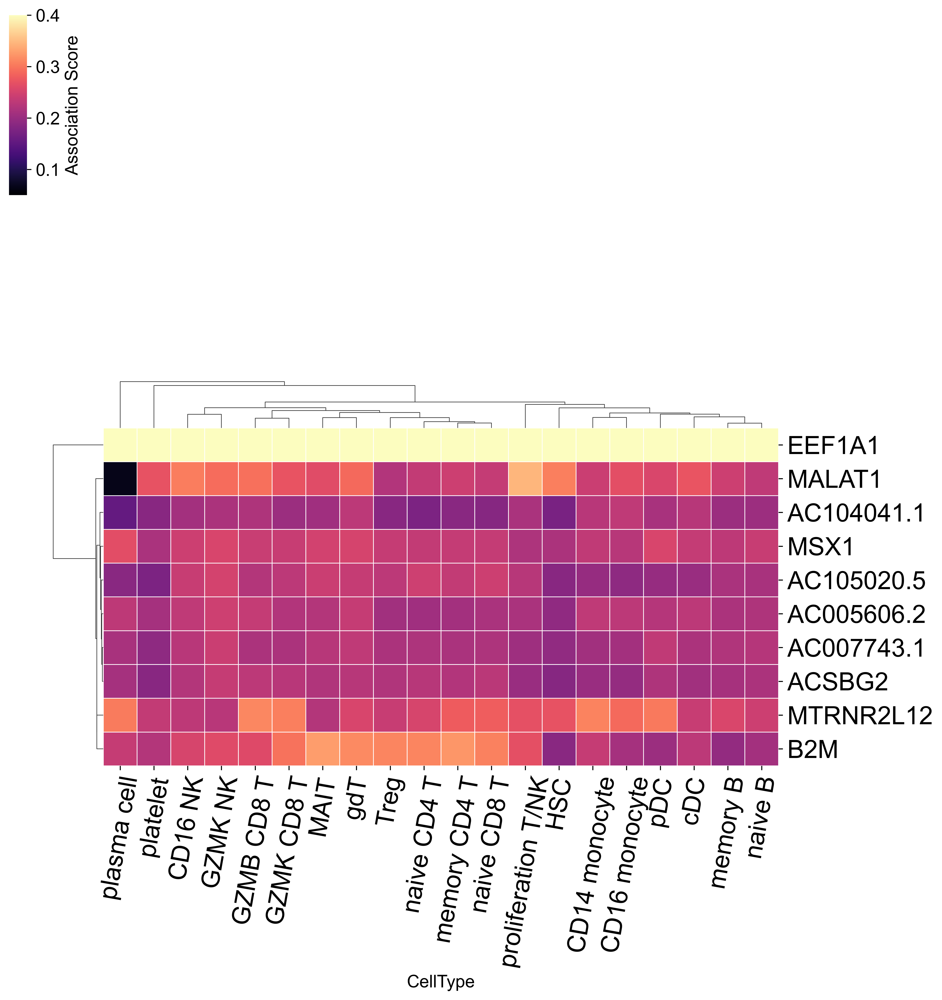

In [70]:
setup_seed(8)

plot_3_df = avg_3_df[top_100_3[:10]]
# std_scaler = StandardScaler()
 
# df_scaled = std_scaler.fit_transform(plot_3_df.values)
# df_scaled = pd.DataFrame(df_scaled, columns=plot_3_df.columns, index = plot_3_df.index)
# plt.subplots(figsize=(30,6))
g = sns.clustermap(plot_3_df.transpose(), vmin = 0.05, vmax = 0.4, cmap = "magma", xticklabels=True, square=True, yticklabels=True, cbar_kws={'label': 'Association Score', "shrink": .90, "pad": 0.01}
                  , dendrogram_ratio = 0.1, cbar=True, linewidth=.4, cbar_pos=(0.0, 1.0, 0.02, 0.2))
g.ax_cbar.grid(False)
g.ax_heatmap.grid(False)
g.ax_heatmap.set_aspect('equal')
# g.cax.remove()

# g = sns.clustermap(data=corr_s, annot=True, fmt='d',cmap = "Blues")
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 20)
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 20, rotation = 80)

hm = g.ax_heatmap.get_position()
col = g.ax_col_dendrogram.get_position()
g.ax_col_dendrogram.set_position([hm.x0, hm.y0 + hm.height, hm.width, col.height * 0.7])
row = g.ax_row_dendrogram.get_position()
g.ax_row_dendrogram.set_position([hm.x0 - row.width * 0.7, hm.y0, row.width * 0.7, hm.height])

# plt.title("3'")
plt.show()

In [62]:
# explainer = Saliency(model_wrapper)
# target = enc_batch.transform(np.array(["1"]).reshape(-1, 1)).toarray()[0].tolist().index(1.0)

# create matrix for the target label that we want to see with the saliency map
# labels_ = [0.0]

# for each in range(c_dim - 1):
#     labels_.append(0.0)

# labels_ = np.array(labels_)

# labels_ = np.tile(labels_, (raw_input.shape[0], 1))

# trg_labels = Variable(CPUTensor(labels_))
    
# trg_labels[:, target] = 1.0

# saliency_map_1 = np.round(NormalizeData(nt.attribute(raw_input.detach(), additional_forward_args = trg_labels,
#                                 nt_type = "smoothgrad",
#                                 stdevs = 0.02,
#                                 draw_baseline_from_distrib = True,
#                                 nt_samples_batch_size = 50).detach().numpy()), 5)

# saliency_map_1 = np.round(NormalizeData(explainer.attribute(raw_input.detach(), additional_forward_args = trg_labels).detach().numpy()), 5)
saliency_map_1_list = []
raw_input_list = create_mini_batches(raw_input, 1024)

for sub_raw_input in raw_input_list:
    saliency_map_1 = np.round(explainer.attribute(sub_raw_input.detach(), target = 1, n_steps = 100).cpu().detach().numpy(), 5)
    saliency_map_1_list.append(saliency_map_1)
    torch.cuda.empty_cache()
saliency_map_1 = np.concatenate(saliency_map_1_list)

In [64]:
five_prime_df = pd.DataFrame(saliency_map_1)
five_prime_df.columns = adata_int.var.index
five_prime_df.index = adata_int.obs.index
# three_prime_df.to_csv("saliency_map_3prime.csv", index = True)

# filter the dataframe so that it is only specific to celltype only
masked = adata_int.obs["batch"] == "1"
five_prime_df = five_prime_df[masked]

# filtering out the gene with fewer number of cell so that we dont get the heavy value with small cell population
temp_df = pd.DataFrame(np.array(adata_int.layers["X_raw"]), index = adata_int.obs.index, columns = adata_int.var.index)
temp_df = temp_df[masked]
gene_filtered = filter_genes_by_expression(temp_df, 0.00001).columns

five_prime_df = five_prime_df[gene_filtered]

five_prime_df["batch"] = adata_int.obs.batch

In [65]:
# five_prime_df.groupby("CellType").mean().round(5).to_csv("IG_5prime_by_celltype_non_normalise.csv")

In [67]:
avg_5_df = five_prime_df.groupby("batch").mean()

In [68]:
top_100_5 = avg_5_df.mean().sort_values(ascending=False)[:50].index

In [69]:
top_100_5

Index(['MT-ATP8', 'PTPRCAP', 'GABARAP', 'NME2', 'MT-ND6', 'MT-CO2', 'IER2',
       'NFKBIA', 'NBPF26', 'JUN', 'HLA-DRB5', 'ATP6V0C', 'IFITM1', 'GADD45B',
       'AP000769.1', 'ZFP36L1', 'NFKBIZ', 'MT-CO1', 'EGR1', 'VIM', 'RPLP0',
       'RHOB', 'HLA-DQA2', 'AC006129.2', 'WSB1', 'CRIP1', 'RPS12', 'PSMA6',
       'EEF1A1', 'CORO1B', 'CNN2', 'ITGA4', 'FOS', 'SYNGR2', 'AHNAK', 'ACTB',
       'VCP', 'FCMR', 'GNB2', 'CRTAP', 'NFKB1', 'FTL', 'RPS24', 'ZYX', 'DDIT4',
       'NUP58', 'CNPY3', 'GRINA', 'MAPRE2', 'PPIA'],
      dtype='object', name='gene_name')

In [70]:
sub_adata = adata_int[:, top_100_5]

In [73]:
count = 0
for each in top_100_5:
    if each in top_100_3:
        count += 1

In [74]:
count

0

In [92]:
def normalize(data): 
    return (data-np.min(data))/(np.max(data)-np.min(data))

In [106]:
avg_3_df

gene_name,FO538757.3,RP5-857K21.4,FAM87B,FAM41C,PLEKHN1,RP11-54O7.17,HES4,ISG15,RP11-54O7.11,LINC01342,...,MT-CO2,MT-ATP8,MT-CO3,MT-ND4,MT-ND6,BX004987.4,AC145212.4,AC007325.4,AC004556.1,AC233755.1
batch,,,,,,,,,,,,,,,,,,,,,
0,0.000359,-0.000748,0.002051,0.026677,-0.001905,0.003057,0.019794,0.034622,0.004338,0.002725,...,-0.346683,-1.098406,-0.067764,-0.027531,-0.360355,-0.004363,-0.002642,0.001255,-0.024043,-0.004055
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [110]:
avg_5_df

gene_name,RP11-34P13.14,FO538757.3,RP5-857K21.4,FAM87B,FAM41C,PLEKHN1,RP11-54O7.17,HES4,ISG15,RP11-54O7.11,...,MT-ATP8,MT-CO3,MT-ND4,MT-ND6,BX004987.4,AC145212.4,AC007325.4,AC004556.1,AC233755.2,AC233755.1
batch,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000193,-0.00349,0.000744,-0.005377,-0.025648,0.001398,-0.003183,-0.016531,-0.022283,-0.004998,...,0.943795,0.065364,0.040998,0.336972,0.003046,0.004456,-0.004625,0.018364,0.012326,0.002248


In [111]:
avg_3_df

gene_name,FO538757.3,RP5-857K21.4,FAM87B,FAM41C,PLEKHN1,RP11-54O7.17,HES4,ISG15,RP11-54O7.11,LINC01342,...,MT-CO2,MT-ATP8,MT-CO3,MT-ND4,MT-ND6,BX004987.4,AC145212.4,AC007325.4,AC004556.1,AC233755.1
batch,,,,,,,,,,,,,,,,,,,,,
0,0.000359,-0.000748,0.002051,0.026677,-0.001905,0.003057,0.019794,0.034622,0.004338,0.002725,...,-0.346683,-1.098406,-0.067764,-0.027531,-0.360355,-0.004363,-0.002642,0.001255,-0.024043,-0.004055
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
# de_genes_df

In [114]:
# defining the threshold
threshold_values = 0.05

important_genes = avg_3_df.transpose()
important_genes = important_genes[(important_genes > threshold_values).values].index.values

important_genes_2 = avg_5_df.transpose()
important_genes_2 = important_genes_2[(important_genes_2 > threshold_values).values].index.values

important_genes_all = np.unique(np.concatenate((important_genes, important_genes_2)))

print(len(important_genes_all))

# print(important_genes)

from sklearn.metrics import f1_score

# let compute for the F1 score
# first get all the genes list as we need to convert into 0 and 1
all_genes = adata_int.var.index.values

# # getting the true labels based on the ground truth
# true_labels = [1 if each in de_genes_df.values.reshape(-1) else 0 for each in all_genes]
# pred_labels = [1 if each in important_genes_all else 0 for each in all_genes]

# f1_score(true_labels, pred_labels)

298


In [115]:
from sklearn.metrics import f1_score, roc_curve, auc

In [116]:
all_genes

array(['RP11-34P13.14', 'FO538757.3', 'RP5-857K21.4', ..., 'AC004556.1',
       'AC233755.2', 'AC233755.1'], dtype=object)

In [ ]:
# from sklearn.metrics import f1_score, roc_curve

# # Define a range of threshold values
# threshold_values = np.linspace(0.0, 0.5, 50)  # Adjust the range as needed

# # Initialize lists to store F1 scores
# f1_scores = []

# for threshold in threshold_values:
#     important_genes = avg_3_df.transpose()
#     important_genes = important_genes[(important_genes > threshold).values].index.values

#     important_genes_2 = avg_5_df.transpose()
#     important_genes_2 = important_genes_2[(important_genes_2 > threshold).values].index.values

#     important_genes_all = np.unique(np.concatenate((important_genes, important_genes_2)))

#     # Getting the true labels based on the ground truth
#     true_labels = [1 if each in de_genes_df.values.reshape(-1) else 0 for each in all_genes]
#     pred_labels = [1 if each in important_genes_all else 0 for each in all_genes]

#     f1 = f1_score(true_labels, pred_labels)
#     f1_scores.append(f1)

# # Create a line plot
# plt.figure()
# plt.plot(threshold_values, f1_scores, lw=2)
# plt.xlabel('Threshold Values')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs. Threshold Values')
# plt.grid()
# plt.show()

In [ ]:
# adata_int.obs["Group_num"]

In [ ]:
# adata_int.obs["Group"]

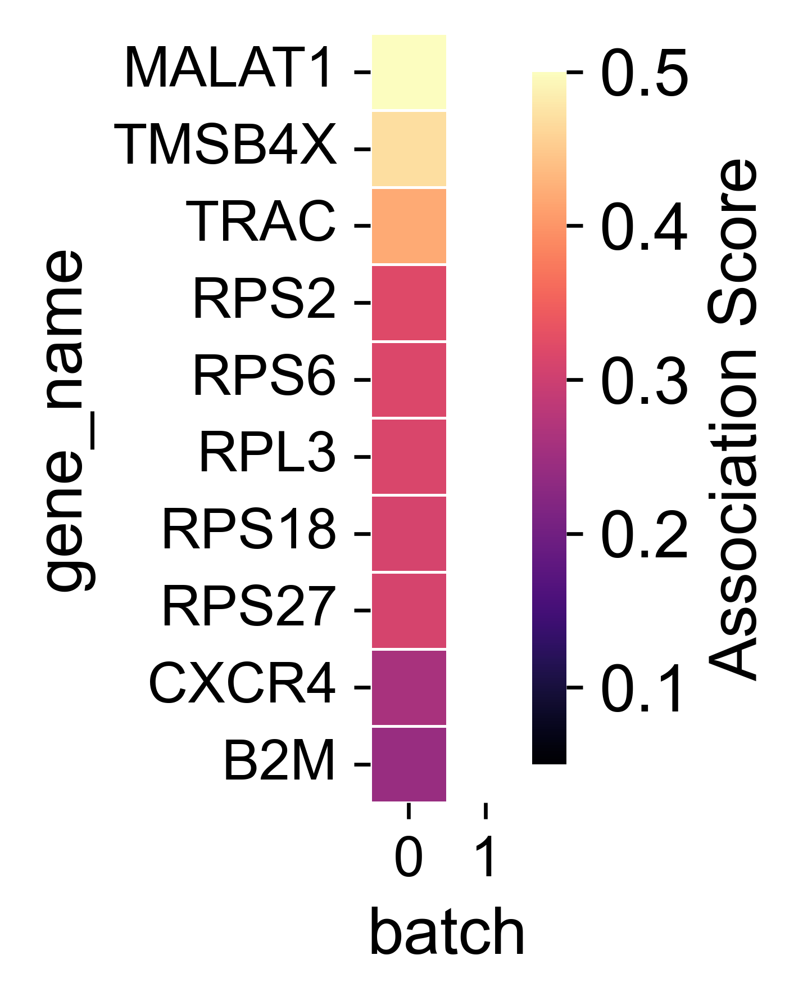

In [120]:
setup_seed(8)

plot_3_df = avg_3_df[top_100_3[:10]]
# std_scaler = StandardScaler()
 
# df_scaled = std_scaler.fit_transform(plot_3_df.values)
# df_scaled = pd.DataFrame(df_scaled, columns=plot_3_df.columns, index = plot_3_df.index)
# plt.subplots(figsize=(30,6))
g = sns.heatmap(plot_3_df.transpose(), vmin = 0.05, vmax = 0.5, cmap = "magma", xticklabels=True, square=True, yticklabels=True, cbar_kws={'label': 'Association Score', "shrink": .90, "pad": 0.01}
, cbar=True, linewidth=.4)
g.grid(False)
# g.grid(False)
g.set_aspect('equal')
# g.cax.remove()

# g = sns.clustermap(data=corr_s, annot=True, fmt='d',cmap = "Blues")
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 12)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 12)

# hm = g.ax_heatmap.get_position()
# col = g.ax_col_dendrogram.get_position()
# g.ax_col_dendrogram.set_position([hm.x0, hm.y0 + hm.height, hm.width, col.height * 0.7])
# row = g.ax_row_dendrogram.get_position()
# g.ax_row_dendrogram.set_position([hm.x0 - row.width * 0.7, hm.y0, row.width * 0.7, hm.height])

# plt.title("3'")
plt.show()


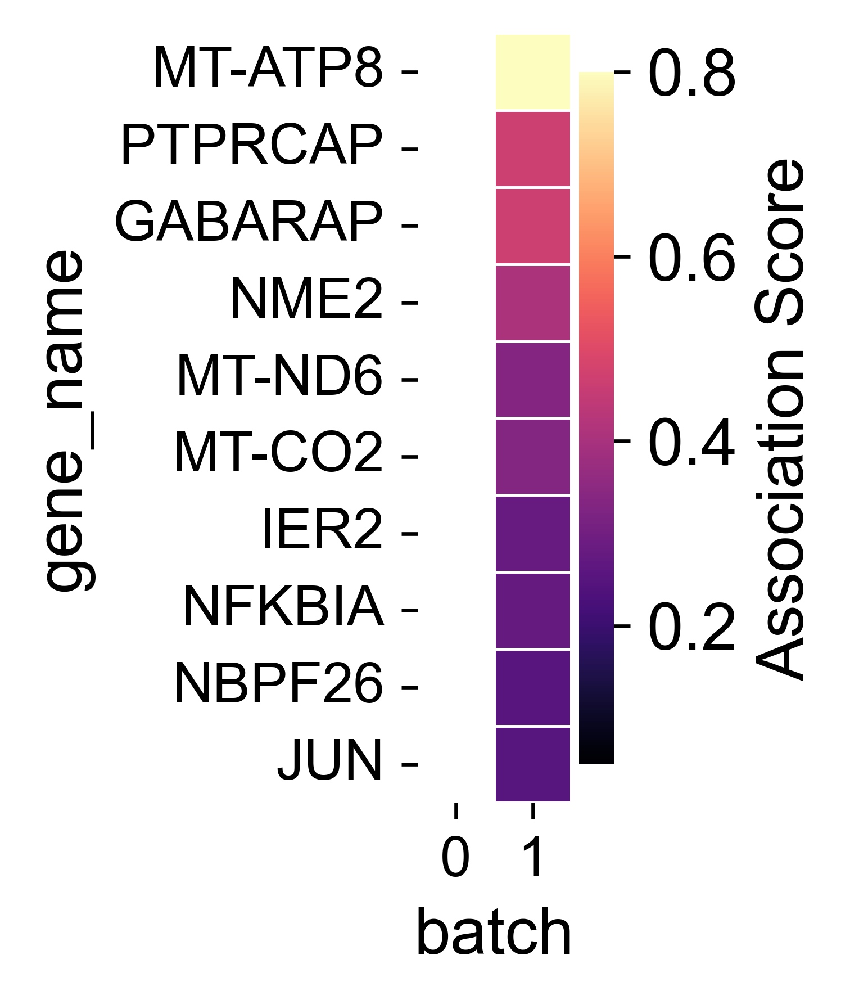

In [121]:
setup_seed(8)

plot_5_df = avg_5_df[top_100_5[:10]]
# std_scaler = StandardScaler()
 
# df_scaled = std_scaler.fit_transform(plot_3_df.values)
# df_scaled = pd.DataFrame(df_scaled, columns=plot_3_df.columns, index = plot_3_df.index)
# plt.subplots(figsize=(30,6))
g = sns.heatmap(plot_5_df.transpose(), vmin = 0.05, vmax = 0.8, cmap = "magma", xticklabels=True, square=True, yticklabels=True, cbar_kws={'label': 'Association Score', "shrink": .90, "pad": 0.01}
, cbar=True, linewidth=.4)
g.grid(False)
# g.grid(False)
g.set_aspect('equal')
# g.cax.remove()

# g = sns.clustermap(data=corr_s, annot=True, fmt='d',cmap = "Blues")
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 12)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 12)

# hm = g.ax_heatmap.get_position()
# col = g.ax_col_dendrogram.get_position()
# g.ax_col_dendrogram.set_position([hm.x0, hm.y0 + hm.height, hm.width, col.height * 0.7])
# row = g.ax_row_dendrogram.get_position()
# g.ax_row_dendrogram.set_position([hm.x0 - row.width * 0.7, hm.y0, row.width * 0.7, hm.height])

# plt.title("3'")
plt.show()

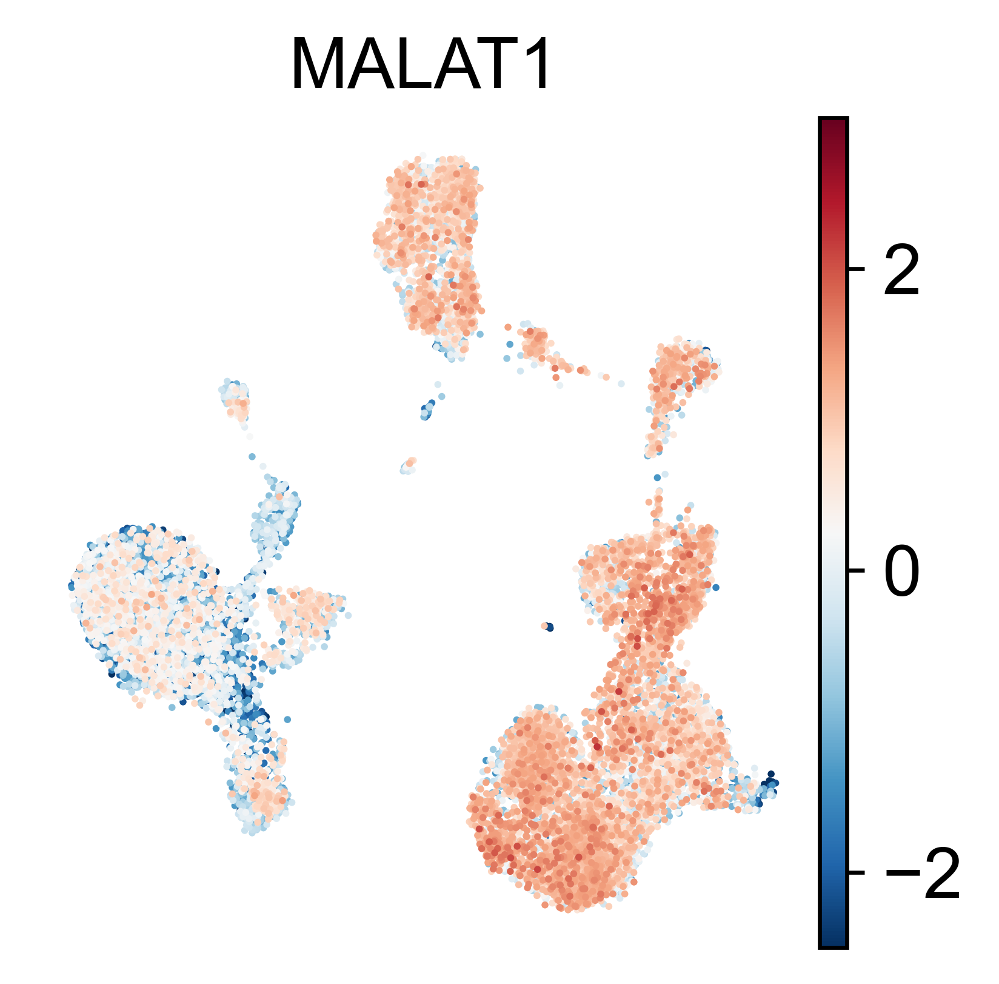

In [122]:
sc.pl.umap(adata_int, color = "MALAT1", layer = "X_raw_scaled", color_map = "RdBu_r", vmax = 3, vmin = -2.5)

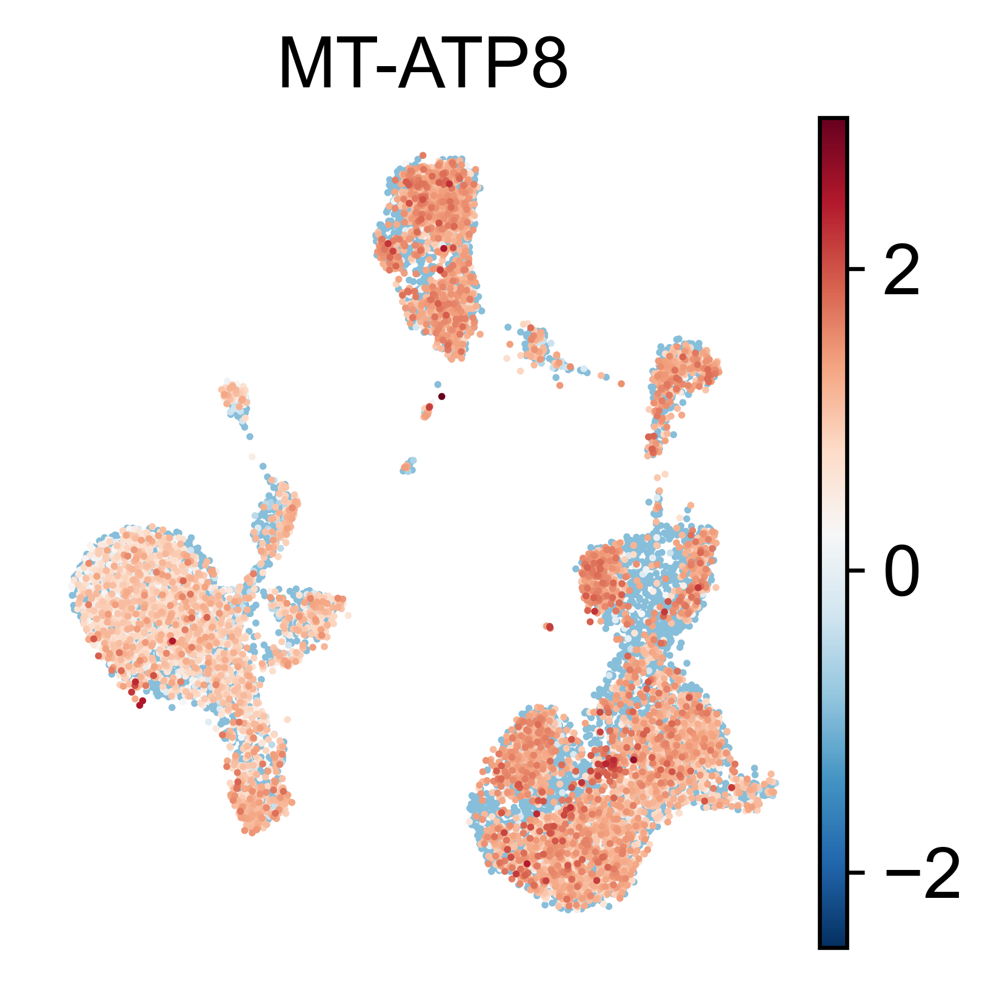

In [123]:
sc.pl.umap(adata_int, color = "MT-ATP8", layer = "X_raw_scaled", color_map = "RdBu_r", vmax = 3, vmin = -2.5)

In [125]:
# # Define the colorcet paletteasdasd
# custom_palette = cc.glasbey_category10

# ax = sc.pl.umap(adata_int, color='Batch_num', palette=custom_palette,
#            frameon=False, legend_fontsize=3.5, show=False)

# # Set the plot title with the desired font size
# ax.set_title('Predicted Cell Type', fontsize=6)

# # Adjust the legend font size
# handles, labels = plt.gca().get_legend_handles_labels()

# # Adjust the size of the circles
# for handle in handles:
#     handle.set_sizes([12])
#     handle.set_edgecolor('black')
#     handle.set_linewidth(0.5)

# # Move the legend to the right side of the plot
# plt.legend(handles=handles, labels=labels, prop={'size': 5}, ncol = 4, 
#            loc='upper center', bbox_to_anchor=(0.5, -0.08))

# # Show the plot
# plt.show()

## Venn Diagram

In [156]:
adata_int = sc.read("genex_pbmc_2.h5ad")

# uncomment this for our model.
if "X_raw" not in adata_int.layers:
    adata = sc.read_h5ad('genex_pbmc_2.h5ad')
    
    # subset to only two cell types that has subtle different which are acinar and ductal cell type
#     adata = adata[adata.obs["celltype"].isin(subset_celltype)].copy()
    
    adata_int.layers["X_raw"] = adata.layers["X_raw"].copy()
    adata_int.uns = adata.uns
    
adata_int.layers["X_raw_scaled"] = sc.pp.scale(adata_int.layers["X_raw"].copy(), copy = True)
adata_int.layers["X_corrected_scaled"] = sc.pp.scale(adata_int.obsm["X_latent"].copy(), copy = True)

In [174]:
adata_int.var.set_index("gene_name", inplace = True)

In [175]:
adata_int.layers["X_corrected"] = adata_int.obsm["X_latent"]

In [176]:
def compute_logfc(cell_adata, group, group_name, layer):
#     cell_adata = deg_adata[deg_adata.obs["CellType"] == cell_type_name]
    group_list = sorted(list(set(cell_adata.obs[group_name])))
    
    pseudocount = 1

    group_A = cell_adata[cell_adata.obs[group_name] == group] #BMA
    group_A_log = np.log2(np.mean(np.expm1(group_A.layers[layer].toarray()), axis = 0) + pseudocount)
    
    list_logfc = []
    
    for each in group_list:
        if each != group:
            group_B = cell_adata[cell_adata.obs[group_name] == each] #LLN
            group_B_log = np.log2(np.mean(np.expm1(group_B.layers[layer].toarray()), axis = 0) + pseudocount)

    #         logfc = pd.DataFrame(np.around(group_A_log - group_B_log, 4), index = cell_adata.var.index, columns = ["logfc"])
            logfc = np.around(group_A_log - group_B_log, 4)
            list_logfc.append(logfc)
    if len(list_logfc) == 1:
        return pd.DataFrame(list_logfc[0], index = cell_adata.var.index, columns = ["logfc"])
    else:
        return pd.DataFrame(np.mean(list_logfc, axis = 0), index = cell_adata.var.index, columns = ["logfc"])

In [177]:
group_name = "Method"
groups = sorted(list(set(adata_int.obs[group_name])))
# groups = sorted(list(set(adata_int.obs["Group"])))

groups

['10X_3prime', '10X_5prime']

In [178]:
adata_int

AnnData object with n_obs × n_vars = 15476 × 10000
    obs: 'Sample', 'n_counts', 'n_genes', 'batch', 'louvain', 'anno', 'Method', 'CellType', 'batch_num'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'CellType_colors', 'batch_colors', 'hvg', 'log1p', 'louvain', 'neighbors', 'umap', 'dendrogram_Method', 'rank_genes_groups', 'rank_genes_groups_filtered'
    obsm: 'X_latent', 'X_pca', 'X_umap', 'X_raw_pca'
    layers: 'X_raw', 'counts', 'log_norm', 'X_raw_scaled', 'X_corrected_scaled', 'X_corrected'
    obsp: 'connectivities', 'distances'

In [179]:
# adata_int.uns['log1p'] = None
adata_int.uns['log1p']['base'] = None

In [180]:
# uncomment for raw data degs
# adata_int.obsm["X_raw_pca"] = sc.pp.pca(adata_int.layers["X_raw"], copy = True)
# sc.tl.dendrogram(adata_int, use_rep = "X_raw_pca", groupby = "Group_num", optimal_ordering=False)

layer_name = "X_corrected"

sc.tl.dendrogram(adata_int, use_rep = "X_pca", groupby = group_name, optimal_ordering=False)
sc.tl.rank_genes_groups(adata_int, group_name, method='wilcoxon', use_raw = False, corr_method='bonferroni', layer = layer_name, pts = True)
adata_int.X = adata_int.layers[layer_name]
sc.tl.filter_rank_genes_groups(adata_int, min_in_group_fraction=0.25, key = "rank_genes_groups",
                               max_out_group_fraction = 1.01,
                               min_fold_change=0.0)


raw_deg = sc.get.rank_genes_groups_df(adata_int, group = groups[0], pval_cutoff=0.05, key='rank_genes_groups_filtered')["names"]

deg_fc = compute_logfc(adata_int, groups[0], group_name, layer_name)
    
## get only the significance genes
boolean_pvalue = []

for gene in deg_fc.index:
    if gene in list(raw_deg):
        boolean_pvalue.append(True)
    else:
        boolean_pvalue.append(False)

deg_fc["pvalue"] = boolean_pvalue

# filtering for the log fold change and the pvalue
filtered = (deg_fc["pvalue"] == True) & ((deg_fc["logfc"] > 0.0) | (deg_fc["logfc"] < -0.0))

# for scVI and Scanorama as they have normalised their data, we only take the p-value
# filtered = (deg_fc["pvalue"] == True)

deg_fc_filtered = deg_fc[filtered]

#     deg_set = deg_set[~pd.isnull(deg_set)][:10]

#     deg_set = np.array(deg_set)

# deg_gene = deg_fc_filtered.sort_values(by="logfc", ascending = False).index.values

raw_deg = deg_fc_filtered.index.values

print(len(raw_deg))

725


In [181]:
corrected_deg = raw_deg

In [182]:
# uncomment for raw data degs
adata_int.obsm["X_raw_pca"] = sc.pp.pca(adata_int.layers["X_raw"], copy = True)
# sc.tl.dendrogram(adata_int, use_rep = "X_raw_pca", groupby = "Group_num", optimal_ordering=False)

layer_name = "X_raw"

sc.tl.dendrogram(adata_int, use_rep = "X_raw_pca", groupby = group_name, optimal_ordering=False)
sc.tl.rank_genes_groups(adata_int, group_name, method='wilcoxon', use_raw = False, corr_method='bonferroni', layer = layer_name, pts = True)
adata_int.X = adata_int.layers[layer_name]
sc.tl.filter_rank_genes_groups(adata_int, min_in_group_fraction=0.25, key = "rank_genes_groups",
                               max_out_group_fraction = 1.01,
                               min_fold_change=0.0)


raw_deg = sc.get.rank_genes_groups_df(adata_int, group = groups[0], pval_cutoff=0.05, key='rank_genes_groups_filtered')["names"]

deg_fc = compute_logfc(adata_int, groups[0], group_name, layer_name)
    
## get only the significance genes
boolean_pvalue = []

for gene in deg_fc.index:
    if gene in list(raw_deg):
        boolean_pvalue.append(True)
    else:
        boolean_pvalue.append(False)

deg_fc["pvalue"] = boolean_pvalue

# filtering for the log fold change and the pvalue
filtered = (deg_fc["pvalue"] == True) & ((deg_fc["logfc"] > 0.0) | (deg_fc["logfc"] < 0.0))

# for scVI and Scanorama as they have normalised their data, we only take the p-value
# filtered = (deg_fc["pvalue"] == True)

deg_fc_filtered = deg_fc[filtered]

#     deg_set = deg_set[~pd.isnull(deg_set)][:10]

#     deg_set = np.array(deg_set)

# deg_gene = deg_fc_filtered.sort_values(by="logfc", ascending = False).index.values

raw_deg = deg_fc_filtered.index.values

print(len(raw_deg))

90


In [183]:
# defining the threshold
threshold_values = 0.05

important_genes = avg_3_df.transpose()
important_genes = important_genes[(important_genes > threshold_values).values].index.values

important_genes_2 = avg_5_df.transpose()
important_genes_2 = important_genes_2[(important_genes_2 > threshold_values).values].index.values

important_genes_all = np.unique(np.concatenate((important_genes, important_genes_2)))

print(len(important_genes_all))

298


In [184]:
corrected_deg

array(['ISG15', 'TNFRSF4', 'TNFRSF25', 'PARK7', 'CLIC4', 'RUNX3', 'CD52',
       'IFI6', 'SESN2', 'RP11-442N24__B.1', 'LCK', 'RBBP4', 'SLC2A1',
       'NASP', 'GPX7', 'MRPL37', 'USP1', 'DNAJB4', 'PRKACB', 'ODF2L',
       'GBP1', 'GBP2', 'TGFBR3', 'TMED5', 'DPYD', 'CDC14A', 'GSTM1',
       'AHCYL1', 'KCNA3', 'HIPK1-AS1', 'CD58', 'CD2', 'NBPF26',
       'CH17-373J23.1', 'HIST2H2BF', 'ANP32E', 'RORC', 'RP1-178F15.4',
       'RPS27', 'ATP8B2', 'PBXIP1', 'CKS1B', 'SYT11', 'LMNA', 'SH2D2A',
       'SLAMF6', 'CD84', 'SLAMF1', 'SH2D1B', 'CD247', 'XCL2', 'XCL1',
       'FAM129A', 'RP11-553K8.5', 'CSRP1', 'PTPN7', 'ATP2B4', 'LAX1',
       'FCMR', 'EPRS', 'AIDA', 'PARP1', 'C1orf35', 'IBA57', 'NTPCR',
       'DESI2', 'SH3YL1', 'YWHAQ', 'NBAS', 'ASXL2', 'EHD3', 'MEMO1',
       'HNRNPLL', 'ERLEC1', 'SPTBN1', 'PELI1', 'SLC1A4', 'WDR54', 'HK2',
       'CD8A', 'CD8B', 'LINC00152', 'IGKC', 'IGKV4-1', 'IGKV1-5',
       'IGKV3-15', 'IGKV3-20', 'IGKV1-39', 'MAL', 'ANKRD39', 'ZAP70',
       'COA5', 'AC09266

In [185]:
important_genes_all

array(['ABLIM1', 'AC006129.2', 'AC016831.7', 'AC092580.4', 'ACTB',
       'ADCY7', 'AFF3', 'AGTRAP', 'AHNAK', 'AIF1', 'ANKRD11',
       'AP000769.1', 'APOBEC3G', 'ARAP1', 'ARHGAP17', 'ARHGAP27', 'ARL4A',
       'ARPC2', 'ARPC5', 'ATF3', 'ATP2A3', 'ATP5A1', 'ATP5B', 'ATP6V0C',
       'B2M', 'BACH2', 'BCL2A1', 'BRI3', 'BTAF1', 'C1orf56', 'C4orf48',
       'CALM2', 'CAMK2D', 'CD2', 'CD27', 'CD37', 'CD3D', 'CD3E', 'CD52',
       'CD63', 'CD69', 'CD79B', 'CD83', 'CD8B', 'CDC42EP3', 'CDKN1A',
       'CFL1', 'CH17-373J23.1', 'CHMP1B', 'CHP1', 'CLEC2D', 'CNN2',
       'CNPY3', 'CORO1B', 'CRIP1', 'CRTAP', 'CS', 'CST3', 'CTA-29F11.1',
       'CTD-3252C9.4', 'CTSB', 'CTSS', 'CUX1', 'CXCR4', 'DDIT4', 'DNAJB9',
       'DPYD', 'DSTN', 'EEF1A1', 'EGR1', 'EIF4A3', 'ELOVL5', 'ENO1',
       'EPSTI1', 'EVI2A', 'FCER1G', 'FCGR3A', 'FCGRT', 'FCMR', 'FKBP11',
       'FLNA', 'FOS', 'FTH1', 'FTL', 'GABARAP', 'GADD45B', 'GAPDH',
       'GBP2', 'GIMAP5', 'GLA', 'GNB2', 'GNG5', 'GNLY', 'GPR183', 'GPX1',
       '

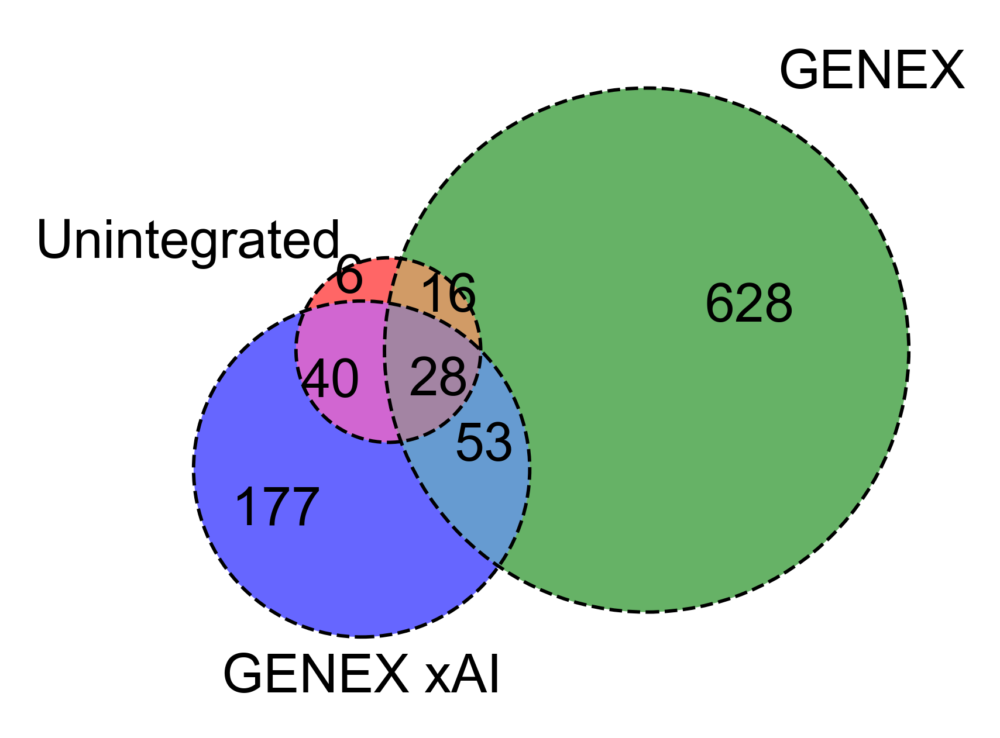

In [186]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3, venn3_circles

# Example sets
set1 = set(raw_deg)
set2 = set(corrected_deg)
set3 = set(important_genes_all)

# Create a Venn diagram
out = venn3([set1, set2, set3], ('Unintegrated', 'GENEX', 'GENEX xAI'), alpha = 0.6)
venn3_circles(subsets=([set1, set2, set3]), linestyle = "dashed", linewidth= 0.7)  

for text in out.set_labels:
    text.set_fontsize(11)
for x in range(len(out.subset_labels)):
    if out.subset_labels[x] is not None:
        out.subset_labels[x].set_fontsize(11)

# for text in venn.set_labels:
#     text.set_fontsize(8)  # Adjust the font size as needed
plt.savefig('plot/pbmc_venn_diagram.svg', format='svg', dpi=300)
plt.show()

In [189]:
# Get the unique elements in Set 3 that are not in Set 1 or Set 2
unique_set1 = set1 - (set3 | set2)

# Display the result
print(unique_set1)

{'RTN4', 'IL32', 'SPCS1', 'CORO1A', 'CYBA', 'CAPZA1'}


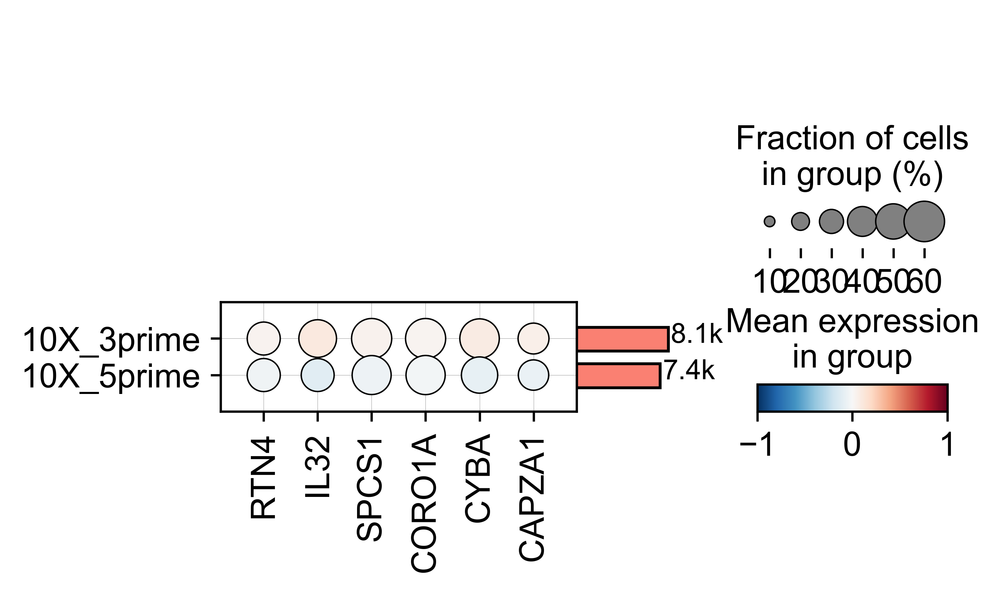

In [195]:
dotplot = sc.pl.dotplot(adata_int, list(unique_set1), groupby=["Method"], layer = "X_raw_scaled", swap_axes = False, vmin = -1., vmax = 1., return_fig=True).add_totals().style(grid=True, cmap = "RdBu_r", dot_edge_lw=0.5,
x_padding=0.8, y_padding=1.0).show()

In [196]:
# Get the unique elements in Set 3 that are not in Set 1 or Set 2
unique_set3 = set3 - (set1 | set2)

# Display the result
print(unique_set3)

{'HIGD1A', 'IL6ST', 'TUBA1B', 'PSMA6', 'TSC22D3', 'TYROBP', 'WSB1', 'CS', 'REL', 'TRDC', 'PPIA', 'AIF1', 'RNF130', 'AFF3', 'GAPDH', 'MYL6', 'ZYX', 'GNG5', 'ACTB', 'MT-ND1', 'CORO1B', 'SLC2A3', 'NBPF14', 'MTPN', 'CHMP1B', 'CTA-29F11.1', 'RPN1', 'OXCT1', 'CD37', 'CRTAP', 'DDIT4', 'C4orf48', 'KLF10', 'HIST2H2AA4', 'ODC1', 'RNU12', 'RP11-138A9.2', 'CAMK2D', 'HLA-DRB5', 'LINC01116', 'CTSB', 'ARPC2', 'ATF3', 'IER2', 'S100A10', 'PPIB', 'AHNAK', 'ANKRD11', 'ARL4A', 'LGALS1', 'MT-CO3', 'NFKBIZ', 'PGD', 'NLRC3', 'RHOC', 'S100A4', 'TAP2', 'UBALD2', 'DNAJB9', 'NCF1', 'UBC', 'SCGB3A1', 'IGKV3-11', 'CTD-3252C9.4', 'MARCH3', 'ATP2A3', 'ARAP1', 'CD83', 'MRPL12', 'RAB31', 'VCP', 'UTRN', 'ARHGAP27', 'OAZ2', 'NUP58', 'FCGR3A', 'PPP1R15A', 'RP11-1000B6.3', 'GADD45B', 'TPI1', 'RNF149', 'H2AFX', 'MYO1F', 'ITGA4', 'UBR4', 'LCP1', 'BTAF1', 'CFL1', 'GIMAP5', 'HIST1H4C', 'ZFP36', 'HMGN2', 'JUN', 'LST1', 'EPSTI1', 'RGS2', 'FCER1G', 'GABARAP', 'CRIP1', 'ZFP36L1', 'KLF4', 'RRP12', 'MAP3K8', 'GRINA', 'GNLY', 'SH3BP

In [209]:
len(unique_set3)

177

In [210]:
uniq_gene_xai = []

for each in top_100_5:
    if each in unique_set3:
#         print(each)
        uniq_gene_xai.append(each)

In [211]:
# uniq_gene_xai

<Figure size 900x900 with 0 Axes>

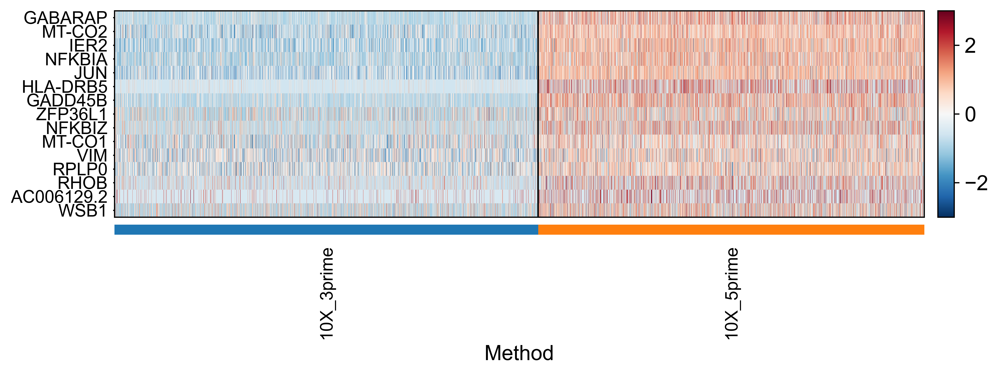

In [212]:
import matplotlib.pyplot as plt
plt.rcParams["axes.grid"] = False
fig = plt.figure()

sc.pl.heatmap(adata_int, uniq_gene_xai[:15], groupby = "Method", show_gene_labels=True, layer = "X_raw_scaled", swap_axes = True, vmin = -3, vmax = 3, cmap = "RdBu_r")


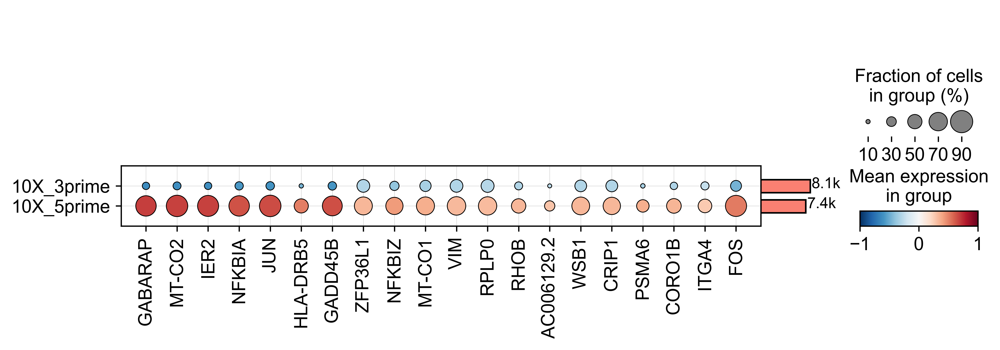

In [213]:
dotplot = sc.pl.dotplot(adata_int, uniq_gene_xai[:20], groupby=["Method"], layer = "X_raw_scaled", swap_axes = False, vmin = -1., vmax = 1., return_fig=True).add_totals().style(grid=True, cmap = "RdBu_r", dot_edge_lw=0.5,
x_padding=0.8, y_padding=1.0).show()

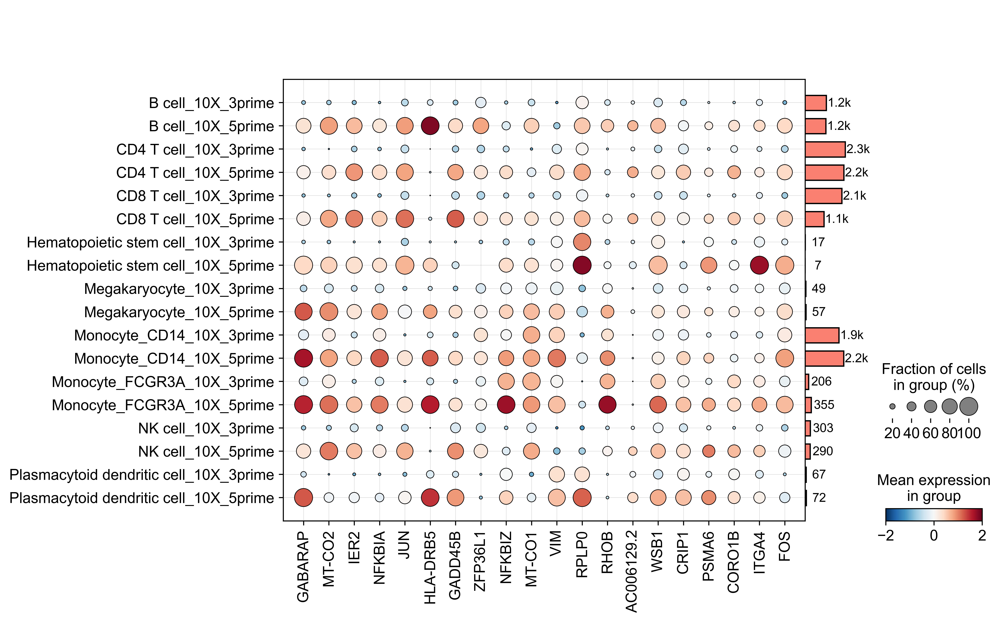

In [257]:
dotplot = sc.pl.dotplot(adata_int, uniq_gene_xai[:20], groupby=["CellType", "Method"], layer = "X_raw_scaled", swap_axes = False, vmin = -2., vmax = 2., return_fig=True).add_totals().style(grid=True, cmap = "RdBu_r", dot_edge_lw=0.5,
x_padding=0.8, y_padding=1.0).show()

In [233]:
five_prime_df = pd.DataFrame(saliency_map_1)
five_prime_df.columns = adata_int.var.index
five_prime_df.index = adata_int.obs.index
# three_prime_df.to_csv("saliency_map_3prime.csv", index = True)

# filter the dataframe so that it is only specific to celltype only
masked = adata_int.obs["batch"] == "1"
five_prime_df = five_prime_df[masked]

# filtering out the gene with fewer number of cell so that we dont get the heavy value with small cell population
temp_df = pd.DataFrame(np.array(adata_int.layers["X_raw"]), index = adata_int.obs.index, columns = adata_int.var.index)
temp_df = temp_df[masked]
gene_filtered = filter_genes_by_expression(temp_df, 0.00001).columns

five_prime_df = five_prime_df[gene_filtered]

five_prime_df["CellType"] = adata_int.obs.CellType

In [234]:
five_prime_df

gene_name,RP11-34P13.14,FO538757.3,RP5-857K21.4,FAM87B,FAM41C,PLEKHN1,RP11-54O7.17,HES4,ISG15,RP11-54O7.11,...,MT-CO3,MT-ND4,MT-ND6,BX004987.4,AC145212.4,AC007325.4,AC004556.1,AC233755.2,AC233755.1,CellType
data_5p-AAACCTGAGCGATAGC-1,-0.00002,-0.00514,-0.00019,-0.00582,-0.01836,0.00057,-0.00208,-0.00697,-0.01365,-0.00392,...,0.08397,0.04491,0.29611,0.00226,0.00343,0.00333,0.00105,0.01206,0.00162,NK cell
data_5p-AAACCTGAGCTAAACA-1,0.00029,-0.00251,0.00080,-0.00716,-0.03233,0.00023,-0.00353,-0.02374,-0.01917,-0.00184,...,0.04346,0.05286,0.36793,0.00140,0.00876,-0.01317,0.03255,0.00984,0.00265,Monocyte_CD14
data_5p-AAACCTGAGGGAGTAA-1,0.00242,-0.00156,0.00385,-0.00320,-0.03229,-0.00026,0.00012,-0.04283,-0.03696,-0.00367,...,0.04087,0.03685,0.38495,0.00651,0.00625,-0.01601,0.04436,0.01017,0.00261,Monocyte_CD14
data_5p-AAACCTGAGTCTTGCA-1,-0.00181,-0.00268,-0.00059,-0.00564,-0.02142,0.00060,-0.00113,-0.00703,-0.01125,-0.00562,...,0.08080,0.03867,0.29521,0.00053,0.00412,0.00277,0.00469,0.01238,0.00440,CD8 T cell
data_5p-AAACCTGAGTTCGATC-1,-0.00036,-0.00225,-0.00100,-0.00591,-0.03160,0.00206,-0.00404,-0.02379,-0.02604,-0.00249,...,0.05515,0.04901,0.37871,0.00544,0.00395,-0.00728,0.03292,0.01011,0.00239,Monocyte_CD14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
data_5p-TTTGTCATCCACGTTC-1,0.00176,-0.00335,-0.00198,-0.00498,-0.04038,0.00083,-0.00222,-0.03323,-0.03052,-0.00346,...,0.04271,0.05424,0.38745,0.00257,0.00347,-0.01281,0.03629,0.00798,0.00292,Monocyte_CD14
data_5p-TTTGTCATCGCGTAGC-1,0.00057,-0.00460,0.00242,-0.00554,-0.02634,0.00098,-0.00572,-0.01131,-0.02140,-0.00781,...,0.07094,0.03917,0.35078,0.00514,0.00393,0.00028,0.01939,0.01478,0.00196,B cell
data_5p-TTTGTCATCTTAACCT-1,-0.00257,-0.00410,-0.00031,-0.00690,-0.02826,0.00139,-0.00080,-0.00550,-0.00979,-0.00514,...,0.07639,0.03320,0.30706,0.00050,0.00379,0.00261,0.01152,0.01454,0.00305,CD8 T cell
data_5p-TTTGTCATCTTACCGC-1,0.00160,-0.00541,-0.00056,-0.00568,-0.03164,0.00277,-0.00390,-0.00953,-0.01381,-0.00536,...,0.07450,0.03393,0.39652,0.00657,0.00432,0.00221,0.02475,0.01423,0.00214,Plasmacytoid dendritic cell


In [235]:
avg_5_df = five_prime_df.groupby("CellType").mean()

In [236]:
avg_5_df

gene_name,RP11-34P13.14,FO538757.3,RP5-857K21.4,FAM87B,FAM41C,PLEKHN1,RP11-54O7.17,HES4,ISG15,RP11-54O7.11,...,MT-ATP8,MT-CO3,MT-ND4,MT-ND6,BX004987.4,AC145212.4,AC007325.4,AC004556.1,AC233755.2,AC233755.1
CellType,,,,,,,,,,,,,,,,,,,,,
B cell,0.000664,-0.003708,0.001911,-0.004550,-0.025925,0.000876,-0.005233,-0.011719,-0.019857,-0.007809,...,0.956693,0.074353,0.035909,0.359733,0.006358,0.004693,0.000851,0.016257,0.014555,0.003360
CD4 T cell,-0.000775,-0.003672,0.000920,-0.005412,-0.021243,0.002358,-0.002750,-0.007905,-0.016497,-0.006029,...,0.830870,0.079210,0.039603,0.310918,0.001041,0.003874,-0.001136,0.007043,0.013105,0.002893
CD8 T cell,-0.000959,-0.003718,0.000229,-0.005624,-0.021957,0.001423,-0.003065,-0.006799,-0.014623,-0.005548,...,0.818224,0.078969,0.039067,0.306161,0.000875,0.004000,0.000341,0.006371,0.013349,0.003347
Hematopoietic stem cell,-0.001650,-0.005034,0.000490,-0.006327,-0.027943,0.001470,-0.006329,-0.007994,-0.015306,-0.006264,...,0.954409,0.073859,0.037600,0.357557,0.001701,0.006323,-0.000817,0.015819,0.019121,0.004467
Megakaryocyte,0.001048,-0.003270,0.000995,-0.005436,-0.029219,0.000797,-0.001655,-0.026933,-0.030010,-0.002770,...,1.030476,0.055713,0.045885,0.350568,0.004223,0.004729,-0.009560,0.026938,0.010928,0.001052
Monocyte_CD14,0.001149,-0.003134,0.000525,-0.005797,-0.031016,0.000794,-0.002465,-0.030269,-0.030816,-0.002700,...,1.092757,0.040112,0.043194,0.361590,0.004099,0.005412,-0.013204,0.035599,0.010065,0.000913
Monocyte_FCGR3A,0.002256,-0.002952,0.000130,-0.004091,-0.030615,0.000732,-0.003291,-0.038445,-0.044120,-0.002482,...,1.109220,0.049680,0.056347,0.369097,0.004789,0.002444,-0.013570,0.033469,0.010338,-0.000263
NK cell,-0.000233,-0.003414,-0.000732,-0.005716,-0.022869,0.001684,-0.003730,-0.006612,-0.013276,-0.004839,...,0.847621,0.083211,0.044467,0.318178,0.001525,0.004478,0.003530,0.005500,0.012276,0.002290
Plasmacytoid dendritic cell,0.001138,-0.004805,-0.000573,-0.006305,-0.030772,0.001309,-0.004542,-0.009747,-0.015863,-0.003927,...,1.016963,0.073248,0.035128,0.373091,0.006970,0.005527,0.000971,0.023356,0.016049,0.001589


In [238]:
plot_5_df

gene_name
GABARAP       0.347678
MT-CO2        0.307425
IER2          0.250155
NFKBIA        0.208210
JUN           0.208390
HLA-DRB5      0.165904
GADD45B       0.154415
ZFP36L1       0.177117
NFKBIZ        0.144477
MT-CO1        0.161126
VIM           0.130624
RPLP0         0.107377
RHOB          0.116464
AC006129.2    0.125457
WSB1          0.115035
CRIP1         0.100008
PSMA6         0.104607
CORO1B        0.126909
ITGA4         0.094386
FOS           0.075730
Name: CD4 T cell, dtype: float64

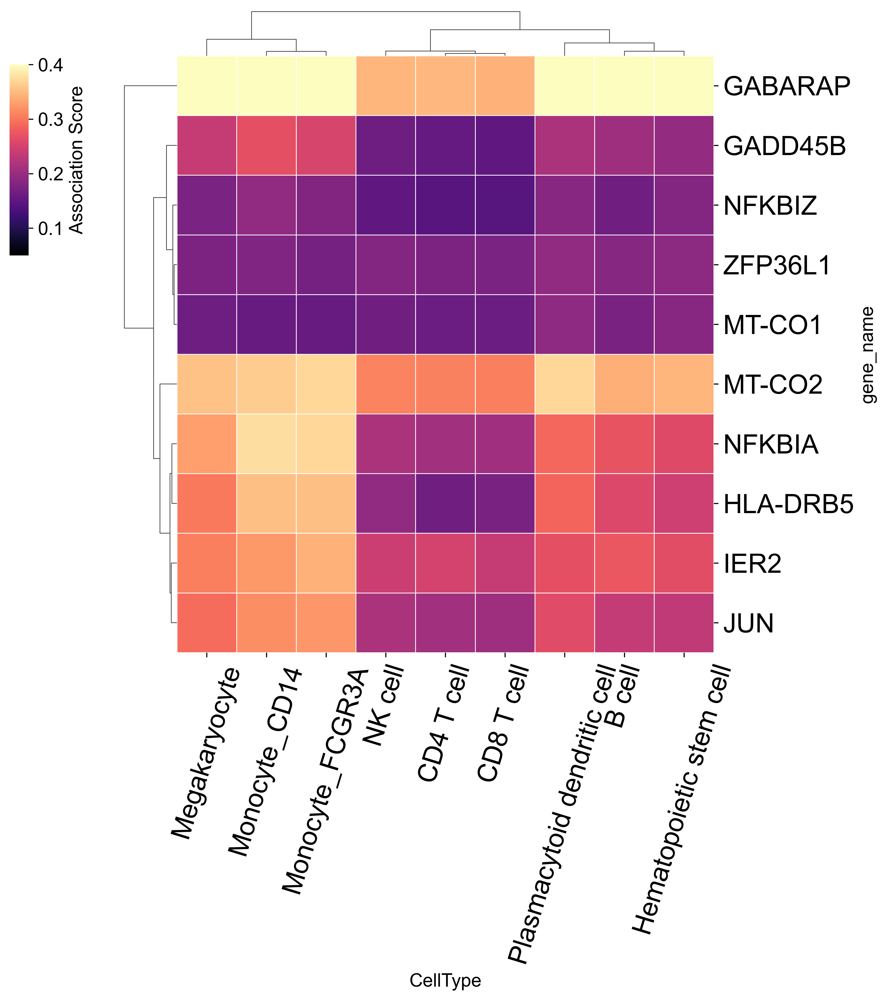

In [255]:
setup_seed(8)

plot_5_df = avg_5_df[uniq_gene_xai[:10]]
# std_scaler = StandardScaler()
 
# df_scaled = std_scaler.fit_transform(plot_3_df.values)
# df_scaled = pd.DataFrame(df_scaled, columns=plot_3_df.columns, index = plot_3_df.index)
# plt.subplots(figsize=(30,6))
g = sns.clustermap(plot_5_df.transpose(), vmin = 0.05, vmax = 0.4, cmap = "magma", xticklabels=True, square=True, yticklabels=True, cbar_kws={'label': 'Association Score', "shrink": .90, "pad": 0.01}
                  , dendrogram_ratio = 0.1, cbar=True, linewidth=.4, cbar_pos=(0.02, 0.7, 0.02, 0.2))
g.ax_cbar.grid(False)
g.ax_heatmap.grid(False)
g.ax_heatmap.set_aspect('equal')
# g.cax.remove()

# g = sns.clustermap(data=corr_s, annot=True, fmt='d',cmap = "Blues")
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 20)
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 20, rotation = 73)

hm = g.ax_heatmap.get_position()
col = g.ax_col_dendrogram.get_position()
g.ax_col_dendrogram.set_position([hm.x0, hm.y0 + hm.height, hm.width, col.height * 0.7])
row = g.ax_row_dendrogram.get_position()
g.ax_row_dendrogram.set_position([hm.x0 - row.width * 0.7, hm.y0, row.width * 0.7, hm.height])

# plt.title("3'")
plt.show()


In [205]:
uniq_gene_xai = []

for each in top_100_3:
    if each in unique_set3:
#         print(each)
        uniq_gene_xai.append(each)

In [208]:
len(uniq_gene_xai)

14

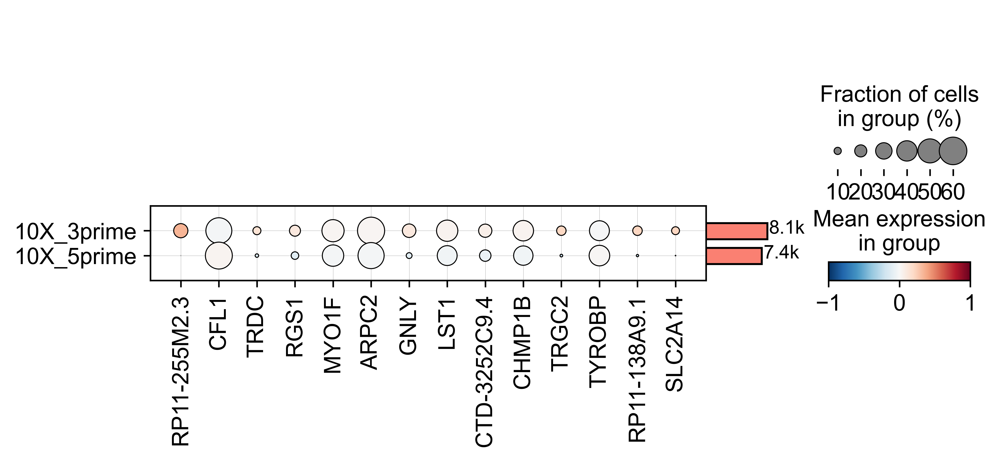

In [206]:
dotplot = sc.pl.dotplot(adata_int, uniq_gene_xai[:20], groupby=["Method"], layer = "X_raw_scaled", swap_axes = False, vmin = -1., vmax = 1., return_fig=True).add_totals().style(grid=True, cmap = "RdBu_r", dot_edge_lw=0.5,
x_padding=0.8, y_padding=1.0).show()

In [ ]:
# setup_seed(8)

# plot_3_df = avg_3_df_scaled[top_100_3[:10]]
# # std_scaler = StandardScaler()
 
# # df_scaled = std_scaler.fit_transform(plot_3_df.values)
# # df_scaled = pd.DataFrame(df_scaled, columns=plot_3_df.columns, index = plot_3_df.index)
# # plt.subplots(figsize=(30,6))
# g = sns.clustermap(plot_3_df.transpose(), vmin = -3, vmax = 3, cmap = "RdBu_r", xticklabels=True, square=True, yticklabels=True, cbar_kws={'label': 'Scaled Association Score', "drawedges": False}
#                   , dendrogram_ratio = 0.1, cbar=True, linewidth=.4, cbar_pos=(0.02, 0.7, 0.02, 0.2))
# g.ax_cbar.grid(False)
# g.ax_heatmap.grid(False)
# g.ax_heatmap.set_aspect('equal')
# # g.cax.remove()

# # g = sns.clustermap(data=corr_s, annot=True, fmt='d',cmap = "Blues")
# g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 20)
# g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 20)

# hm = g.ax_heatmap.get_position()
# col = g.ax_col_dendrogram.get_position()
# g.ax_col_dendrogram.set_position([hm.x0, hm.y0 + hm.height, hm.width, col.height * 0.7])
# row = g.ax_row_dendrogram.get_position()
# g.ax_row_dendrogram.set_position([hm.x0 - row.width * 0.7, hm.y0, row.width * 0.7, hm.height])

# # plt.title("3'")
# plt.show()

In [ ]:
# # access the heatmap axis
# ax = g.ax_heatmap

# # get the x axis labels
# x_axis_labels = [label.get_text() for label in ax.get_xticklabels()]
# y_axis_labels = [label.get_text() for label in ax.get_yticklabels()]
# # x_axis_labels

In [ ]:
# raw_df_gene = adata_int.to_df(layer = "X_raw_scaled")
# raw_df_gene["CellType"] = adata_int.obs["CellType"]
# raw_df_gene["batch"] = adata_int.obs["batch"]
# plot_raw_df = raw_df_gene.groupby(["CellType", "batch"]).mean()
# plot_raw_df = plot_raw_df[y_axis_labels]

# fig, ax = plt.subplots(figsize=(10,15))
# g = sns.heatmap(plot_raw_df.loc[x_axis_labels], linewidth=.4, ax=ax, vmin = -3, vmax = 3, cmap = "RdBu_r", square =  True, xticklabels=True, yticklabels=True, cbar_kws={'label': 'mean expression', "shrink": .90, "pad": 0.01}, cbar=False)
# g.grid(False)
# g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 20)
# g.set_yticklabels(g.get_yticklabels(), fontsize = 20, rotation=0)
# # plt.yticks(rotation=90)
# # plt.gca().yaxis.tick_right()
# # plt.gca().tick_params(axis='y', which='major', labelsize=8)
# # plt.title("3'")
# plt.show()

In [ ]:
# raw_df_gene = adata_int.to_df(layer = "X_corrected_scaled")
# raw_df_gene["CellType"] = adata_int.obs["CellType"]
# raw_df_gene["batch"] = adata_int.obs["batch"]
# plot_raw_df = raw_df_gene.groupby(["CellType", "batch"]).mean()
# plot_raw_df = plot_raw_df[y_axis_labels]

# fig, ax = plt.subplots(figsize=(10,15))
# g = sns.heatmap(plot_raw_df.loc[x_axis_labels], linewidth=.4, ax=ax, vmin = -3, vmax = 3, cmap = "RdBu_r", square =  True, xticklabels=True, yticklabels=True, cbar_kws={'label': 'mean expression', "shrink": .90, "pad": 0.01}, cbar=False)
# g.grid(False)
# g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 20)
# g.set_yticklabels(g.get_yticklabels(), fontsize = 20, rotation=0)
# # plt.yticks(rotation=90)
# # plt.gca().yaxis.tick_right()
# # plt.gca().tick_params(axis='y', which='major', labelsize=8)
# # plt.title("3'")
# plt.show()